In [1]:
using Revise
using contacto
using Chemfiles
using StaticArrays
using Plots
plotly()

Plots.PlotlyBackend()

In [2]:
const AtomRange_t = UnitRange{Int64}
const AtomXyz_t = Float64

Float64

In [3]:
function add_indices_to_bin_tree(srt_xyz::Array{AtomXyz_t, 1},
    englobing_range::AtomRange_t, parent_range::AtomRange_t,
    middle_split::Float64)

    indices_range_left = AtomRange_t
    indices_range_right = AtomRange_t
    
    if englobing_range.start == 0 & englobing_range.stop == 0
        # 0 átomos en la celda
        indices_range_left = 0:0
        indices_range_right = 0:0
    elseif length(englobing_range) >= 1        
        xyz_idx = searchsortedlast(srt_xyz[englobing_range], middle_split)
        
        if xyz_idx == 0
            # Todos los átomos en la celda de la derecha
            indices_range_left = 0:0
            indices_range_right = englobing_range
        elseif xyz_idx == length(englobing_range)
            # Todos los átomos en la celda de la izquierda
            indices_range_left = englobing_range
            indices_range_right = 0:0
        else
            # Divido en 2 celdas más 
            xyz_boundary = xyz_idx + englobing_range.start - 1 
            indices_range_left = parent_range.start:xyz_boundary
            indices_range_right = xyz_boundary+1:parent_range.stop
        end
    else
        error(parent_range, "  ", englobing_range, "  re loco.")
    end 
     
    return indices_range_left, indices_range_right
end

function spread_indices_on_bin_tree(srt_xyz::Array{AtomXyz_t, 1},
        nodes_ranges::Array{Array{Tuple{Int64,Int64},1},1},
        nodes_bounds::Array{Array{Int64,1},1},
        xyz_min::AtomXyz_t, natoms::Int, cutoff::Number, nlevels::Int)
    
    atom_ranges_tree = Array{Array{AtomRange_t, 1}, 1}(undef, nlevels+1)
    atom_ranges_tree[1] = [1:natoms]

    for i = 1:nlevels
        k = i + 1
        atom_ranges_tree[k] = []
        for j = 1:2^(i-1)
            englobing_range = atom_ranges_tree[i][j]
            ancho = nodes_ranges[k][j*2][2] - nodes_ranges[k][j*2-1][1]
            if ancho > 1
                middle_split = xyz_min + cutoff * nodes_bounds[k][j]
                
                indices_range_left, indices_range_right = add_indices_to_bin_tree(
                    srt_xyz, englobing_range, atom_ranges_tree[i][j], middle_split)
                push!(atom_ranges_tree[k], indices_range_left)
                push!(atom_ranges_tree[k], indices_range_right)
            else
                push!(atom_ranges_tree[k], englobing_range)
            end
        end
    end

    return atom_ranges_tree[end]
end

spread_indices_on_bin_tree (generic function with 1 method)

In [4]:
# Get the min/max coordinates.
function get_rounded_tops(xyz::Array{AtomXyz_t, 2}, f::Function)
    return [ floor(f(xyz[:, 1])),  floor(f(xyz[:, 2])), floor(f(xyz[:, 3])) ]
end

# Get the number of cells required to englobe the input coordinates, given a `cutoff`
# (cell dimension). Also return the number of levels the binary tree needs to partition
# the englobing voxel.
function get_ncells_nlevels(minis::Array{Float64, 1}, maxis::Array{Float64, 1},
        cutoff::Number)
    espacio = [ maxis[1] - minis[1] ; maxis[2] - minis[2] ; maxis[3] - minis[3] ]
    ncells = convert(Int64, ceil(maximum(espacio) / cutoff))
    nlevels = convert(Int64, ceil(log2(ncells)))
    return ncells, nlevels
end

# Get the cell list's voxel vertices.
function get_cell_vtces(minis::Array{Float64, 1}, cutoff::Number, ncells::Int)
    x_min = minis[1] ; y_min = minis[2] ; z_min = minis[3]
    
    cell_vtces = vcat([ x_min y_min z_min ], [ x_min+cutoff y_min z_min ],
        [ x_min y_min+cutoff z_min ], [ x_min+cutoff y_min+cutoff z_min ],
        [ x_min y_min z_min+cutoff ], [ x_min+cutoff y_min z_min+cutoff ],
        [ x_min y_min+cutoff z_min+cutoff ], [ x_min+cutoff y_min+cutoff z_min+cutoff ])
    
    celdas = Array{Array{Float64, 2}, 1}(undef, ncells^3);
    let m = 1, vect_z = zeros(8)
        for i = 1:ncells
            let vect_y = zeros(8)
                for j = 1:ncells
                    let vect_x = zeros(8)
                        for k = 1:ncells
                            global celdas[m] = cell_vtces + hcat(vect_x, vect_y, vect_z)
                            m += 1
                            vect_x .+= cutoff
                        end
                    end
                    vect_y .+= cutoff
                end
            end
            vect_z .+= cutoff
        end
    end

    return celdas
end

# Construct the binary tree sizes and bounds.
function get_bin_tree(ncells::Int, nlevels::Int)
    nodes_ranges = Array{Array{Tuple{Int64,Int64}, 1}, 1}(undef, nlevels+1)
    nodes_ranges[1] = [(0, ncells)]
    nodes_bounds = Array{Array{Int64, 1}, 1}(undef, nlevels+1)
    nodes_bounds[1] = [ncells]

    for i = 1:nlevels
        k = i + 1
        nodes_ranges[k] = []
        nodes_bounds[k] = []
        prev = 0
        for j = 1:2^(i-1)
            rango = nodes_ranges[i][j][2] - nodes_ranges[i][j][1]
            lh_node_rango = convert(Int64, ceil(rango / 2)) + prev
            rh_node_rango = rango + prev
            push!(nodes_ranges[k], (prev, lh_node_rango))
            push!(nodes_ranges[k], (lh_node_rango, rh_node_rango))
            
            push!(nodes_bounds[k], lh_node_rango)
            prev = rh_node_rango
        end
    end
    
    return nodes_ranges, nodes_bounds
end

get_bin_tree (generic function with 1 method)

In [5]:
in_trj = Trajectory("/home/pbarletta/labo/contacto/aux/1mtn.pdb")
in_frm = read(in_trj)
in_top = Topology(in_frm)
t_xyz = positions(in_frm) 
xyz = round.(transpose(t_xyz), digits = 3)

natoms = size(xyz)[1]
cutoff = round(15., digits = 3)
xyz_min = get_rounded_tops(xyz, minimum)
xyz_max = get_rounded_tops(xyz, maximum)
ncells, nlevels = get_ncells_nlevels(xyz_min, xyz_max, cutoff)
init_vox = get_cell_vtces(xyz_min, cutoff, ncells)
nodes_ranges, nodes_bounds = get_bin_tree(ncells, nlevels)

┌ Warning: `finalizer(o, f::Function)` is deprecated, use `finalizer(f, o)` instead.
│   caller = Type at Chemfiles.jl:35 [inlined]
└ @ Core /home/pbarletta/.julia/packages/Chemfiles/MzvVI/src/Chemfiles.jl:35
┌ Warning: `assert` is deprecated, use `@assert` instead.
│   caller = read(::Trajectory) at Trajectory.jl:36
└ @ Chemfiles /home/pbarletta/.julia/packages/Chemfiles/MzvVI/src/Trajectory.jl:36
┌ Warning: `finalizer(o, f::Function)` is deprecated, use `finalizer(f, o)` instead.
│   caller = Type at Chemfiles.jl:108 [inlined]
└ @ Core /home/pbarletta/.julia/packages/Chemfiles/MzvVI/src/Chemfiles.jl:108
┌ Warning: `assert` is deprecated, use `@assert` instead.
│   caller = ip:0x0
└ @ Core :-1
┌ Warning: `finalizer(o, f::Function)` is deprecated, use `finalizer(f, o)` instead.
│   caller = Type at Chemfiles.jl:51 [inlined]
└ @ Core /home/pbarletta/.julia/packages/Chemfiles/MzvVI/src/Chemfiles.jl:51
┌ Warning: `unsafe_wrap(T, pointer, dims, own)` is deprecated, use `unsafe_wrap(T, poin

(Array{Tuple{Int64,Int64},1}[[(0, 4)], [(0, 2), (2, 4)], [(0, 1), (1, 2), (2, 3), (3, 4)]], Array{Int64,1}[[4], [2], [1, 3]])

In [6]:
arbol = contacto.tree(ncells, natoms, xyz);
nodo = arbol.root;

x_tree = spread_indices_on_bin_tree(nodo.xyz[nodo.srt_idx, nodo.node_level+1], 
    nodes_ranges, nodes_bounds, xyz_min[nodo.node_level+1],
    nodo.natoms, cutoff, nlevels)

for i = 1:nodo.n
    nodo[i].idx_range = x_tree[i]
        
    if nodo[i].idx_range == 0:0
        nodo[i].natoms = 0 
        nodo[i].srt_idx = [0]
        nodo[i].xyz = [0. 0.] 
        for j = 1:nodo.n
            for k = 1:nodo.n
                nodo[i][j][k].idx_range == 0:0 
                nodo[i][j][k].natoms = 0 
                nodo[i][j][k].srt_idx = [0] 
                nodo[i][j][k].xyz = [0. 0. 0.] 
            end 
        end 
    else
        nodo[i].natoms = length(nodo[i].idx_range)
        nodo[i].srt_idx = nodo.srt_idx[nodo[i].idx_range]
        nodo[i].xyz = nodo.xyz[nodo[i].srt_idx, :]
             
        srt_idx_y = sortperm(nodo[i].xyz[:, nodo[i].node_level+1])
        srt_y = nodo[i].xyz[srt_idx_y, nodo[i].node_level+1]
        y_tree = spread_indices_on_bin_tree(srt_y, nodes_ranges, nodes_bounds,
            xyz_min[nodo[i].node_level+1], nodo[i].natoms, cutoff, nlevels)

        for j = 1:nodo.n
            nodo[i][j].idx_range = y_tree[j]

            if nodo[i][j].idx_range == 0:0
                nodo[i][j].natoms = 0
                nodo[i][j].srt_idx = [0]
                nodo[i][j].xyz = [0. 0. 0.]
                for k = 1:nodo.n
                    nodo[i][j][k].idx_range = 0:0
                    nodo[i][j][k].natoms = 0
                    nodo[i][j][k].srt_idx = [0]
                    nodo[i][j][k].xyz = [0. 0. 0.]
                end 
            else
                nodo[i][j].natoms = length(nodo[i][j].idx_range)
                nodo[i][j].srt_idx = nodo[i].srt_idx[srt_idx_y[nodo[i][j].idx_range]]
                nodo[i][j].xyz = nodo.xyz[nodo[i][j].srt_idx, :]
             
                srt_idx_z = sortperm(nodo[i][j].xyz[:, nodo[i][j].node_level+1])
                srt_z = nodo[i][j].xyz[srt_idx_z, nodo[i][j].node_level+1]
                z_tree = spread_indices_on_bin_tree(srt_z, nodes_ranges, nodes_bounds,
                    xyz_min[nodo[i][j].node_level+1], nodo[i][j].natoms, cutoff, nlevels)
             
                for k = 1:nodo.n
                    nodo[i][j][k].idx_range = z_tree[k]

                    if nodo[i][j][k].idx_range == 0:0
                        nodo[i][j][k].natoms = 0
                        nodo[i][j][k].srt_idx = [0]
                        nodo[i][j][k].xyz = [0. 0. 0.]
                    else
                        nodo[i][j][k].natoms = length(nodo[i][j][k].idx_range)
                        nodo[i][j][k].srt_idx = nodo[i][j].srt_idx[srt_idx_z[
                                nodo[i][j][k].idx_range]]
                        nodo[i][j][k].xyz = nodo.xyz[nodo[i][j][k].srt_idx, :]
                    end
                end
            end
        end
    end
end

┌ Warning: Deprecated syntax `implicit assignment to global variable `k``.
│ Use `global k` instead.
└ @ nothing none:0
┌ Warning: Loop variable `k` around In[7]:8 overwrites a variable in an enclosing scope. In the future the variable will be local to the loop instead.
└ @ nothing In[7]:8


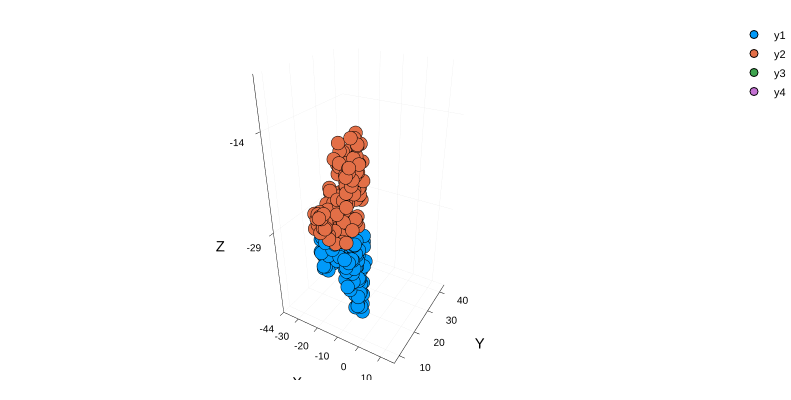

In [7]:
i = 2
j = 1
k = 1
ploteo = scatter(nodo[i][j][k].xyz[:, 1], nodo[i][j][k].xyz[:, 2],
    nodo[i][j][k].xyz[:, 3],
xlim = (xyz_min[1], xyz_max[1]), ylim = (xyz_min[2], xyz_max[2]), zlim = (xyz_min[3], xyz_max[3]),
xlabel = "X", ylabel = "Y", zlabel = "Z")

#for i = 1:4
    #for j = 1:4
        for k = 2:ncells
            ploteo = scatter!(nodo[i][j][k].xyz[:, 1], nodo[i][j][k].xyz[:, 2],
            nodo[i][j][k].xyz[:, 3],
            xlabel = "X", ylabel = "Y", zlabel = "Z",
            zticks = collect(xyz_min[3]:cutoff:xyz_max[3]))
        end
    #end
#end
ploteo

┌ Warning: Deprecated syntax `implicit assignment to global variable `j``.
│ Use `global j` instead.
└ @ nothing none:0
┌ Warning: Loop variable `j` around In[8]:6 overwrites a variable in an enclosing scope. In the future the variable will be local to the loop instead.
└ @ nothing In[8]:6


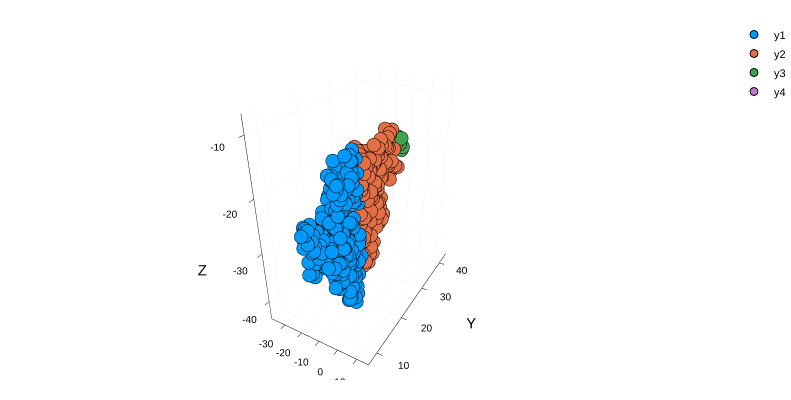

In [8]:
i = 2
j = 1
ploteo = scatter(nodo[i][j].xyz[:, 1], nodo[i][j].xyz[:, 2], nodo[i][j].xyz[:, 3],
xlim = (xyz_min[1], xyz_max[1]), ylim = (xyz_min[2], xyz_max[2]), zlim = (xyz_min[3], xyz_max[3]),
xlabel = "X", ylabel = "Y", zlabel = "Z")

#for i = 3:3
    for j = 2:ncells
        ploteo = scatter!(nodo[i][j].xyz[:, 1], nodo[i][j].xyz[:, 2],
                                        nodo[i][j].xyz[:, 3],
            xlim = (xyz_min[1], xyz_max[1]), ylim = (xyz_min[2], xyz_max[2]), 
            zlim = (xyz_min[3], xyz_max[3]),
            xlabel = "X", ylabel = "Y", zlabel = "Z")
    end
#end
ploteo

┌ Warning: Deprecated syntax `implicit assignment to global variable `i``.
│ Use `global i` instead.
└ @ nothing none:0
┌ Warning: Loop variable `i` around In[9]:5 overwrites a variable in an enclosing scope. In the future the variable will be local to the loop instead.
└ @ nothing In[9]:5


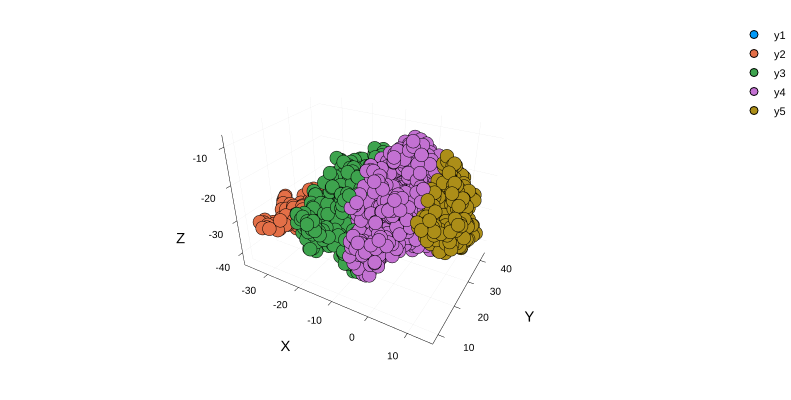

In [9]:
i = 1
ploteo = scatter(nodo[i].xyz[:, 1], nodo[i].xyz[:, 2], nodo[i].xyz[:, 3],
xlim = (xyz_min[1], xyz_max[1]), ylim = (xyz_min[2], xyz_max[2]), zlim = (xyz_min[3], xyz_max[3]),
xlabel = "X", ylabel = "Y", zlabel = "Z")

for i = 1:ncells
    ploteo = scatter!(nodo[i].xyz[:, 1], nodo[i].xyz[:, 2], nodo[i].xyz[:, 3],
        xlim = (xyz_min[1], xyz_max[1]), ylim = (xyz_min[2], xyz_max[2]), 
        zlim = (xyz_min[3], xyz_max[3]),
        xlabel = "X", ylabel = "Y", zlabel = "Z")
end
ploteo

In [10]:
cell_list_mtx = Array{Array{Int64, 1}, 3}(undef, ncells, ncells, ncells)
for i = 1:ncells
    for j = 1:ncells
        for k = 1:ncells
            cell_list_mtx[i, j, k] = Array{Int64, 1}()
            cell_list_mtx[i, j, k] = nodo[i][j][k].srt_idx
        end
    end
end

┌ Warning: Deprecated syntax `implicit assignment to global variable `i``.
│ Use `global i` instead.
└ @ nothing none:0
┌ Warning: Deprecated syntax `implicit assignment to global variable `j``.
│ Use `global j` instead.
└ @ nothing none:0
┌ Warning: Deprecated syntax `implicit assignment to global variable `k``.
│ Use `global k` instead.
└ @ nothing none:0
┌ Warning: Loop variable `i` around In[10]:2 overwrites a variable in an enclosing scope. In the future the variable will be local to the loop instead.
└ @ nothing In[10]:2
┌ Warning: Loop variable `j` around In[10]:3 overwrites a variable in an enclosing scope. In the future the variable will be local to the loop instead.
└ @ nothing In[10]:3
┌ Warning: Loop variable `k` around In[10]:4 overwrites a variable in an enclosing scope. In the future the variable will be local to the loop instead.
└ @ nothing In[10]:4


-------------------

In [ ]:
mutable struct node
    n::Int64
    node_level::Int64
    idx_range::AtomRange_t
    srt_idx::Array{Int64, 1}
    natoms::Int64
    xyz::Array{Float64, 2}
    children::Array{node, 1}
    
    node() = new()

    function node(ncells::Int64, node_level::Int64)
        new(Array{node, 1}(undef, ncells), ncells, node_level, 0:0)
    end

    function node(ncells::Int64, node_level::Int64)
        new(Array{node, 1}(undef, ncells), ncells, node_level)
    end

    function node(ncells::Int64, node_level::Int64, idx_range::AtomRange_t,
        srt_idx::Array{Int64, 1})
        new(Array{node, 1}(undef, ncells), ncells, node_level, idx_range, srt_idx,
        length(srt_idx))
    end

    function node(ncells::Int64, node_level::Int64, idx_range::AtomRange_t,
        srt_idx::Array{Int64, 1}, xyz::Array{Float64, 2})
        new(Array{node, 1}(undef, ncells), ncells, node_level, idx_range, srt_idx,
            length(srt_idx), xyz)
    end
    
    function node(ncells::Int, xyz::Array{Float64, 2})
        natoms = size(xyz)[2]
        if 
           error("Bad dimensions on input coordinates")
        end
        self = new(ncells, 0, 1:natoms, sortperm(xyz[:, 1]), xyz)
        
        for i = 1:ncells
            root[i] = node(ncells, 1)
            for j = 1:ncells
                root[i][j] = node(ncells, 2)
                for k = 1:ncells
                    root[i][j][k] = node(0, 3)
                end
            end
        end            
        new(root, ncells)
    end
end

In [31]:
nodo.children[1]

contacto.node(contacto.node[node(contacto.node[node(contacto.node[], 0, 3, 1:65, [289, 286, 290, 287, 284, 235, 230, 288, 244, 224  …  222, 181, 194, 179, 176, 209, 196, 195, 203, 212], 65, [-23.552 18.423 -34.987; -24.418 20.708 -34.167; … ; -26.708 18.773 -29.201; -25.256 21.606 -29.2]), node(contacto.node[], 0, 3, 66:77, [204, 202, 155, 184, 154, 180, 210, 205, 214, 135, 131, 152], 12, [-27.166 19.718 -28.911; -28.467 17.646 -28.9; … ; -23.303 12.695 -26.448; -23.073 21.172 -24.619]), node(contacto.node[], 0, 3, 0:0, [0], 0, [0.0 0.0 0.0]), node(contacto.node[], 0, 3, 0:0, [0], 0, [0.0 0.0 0.0])], 4, 2, 1:77, [192, 193, 191, 195, 190, 194, 187, 196, 188, 185  …  235, 243, 234, 212, 214, 213, 246, 244, 259, 229], 77, [-29.947 7.438 -29.711; -28.377 8.116 -29.77; … ; -26.833 21.915 -31.926; -32.596 21.953 -31.988]), node(contacto.node[node(contacto.node[], 0, 3, 1:33, [269, 275, 266, 271, 267, 264, 268, 265, 274, 242  …  245, 237, 238, 239, 217, 251, 249, 215, 250, 253], 33, [-25.448 

In [11]:
mutable struct node_1
    n::Int64
    idx_range::AtomRange_t
    srt_idx::Array{Int64, 1}
    natoms::Int64
    xyz::Array{Float64, 2}
    
    node() = new()

    function node_1(ncells::Int)
        new(ncells, 0:0)
    end

    function node_1(ncells::Int, idx_range::AtomRange_t, srt_idx::Array{Int, 1})
        new(ncells, idx_range, srt_idx, length(srt_idx))
    end

    function node_1(ncells::Int, idx_range::AtomRange_t, srt_idx::Array{Int, 1},
        xyz::Array{Float64, 2})
        new(ncells, idx_range, srt_idx, length(srt_idx), xyz)
    end
end

In [ ]:
mutable struct node_1
    n::Int64
    node_level::Int64
    idx_range::AtomRange_t
    srt_idx::Array{Int64, 1}
    natoms::Int64
    xyz::Array{Float64, 2}
    children::Array{node_1, 1}
    
    node_1() = new()
    
    function node_1(ncells::Int64, node_level::Int64, idx_range::AtomRange_t,
        srt_idx::Array{Int64, 1}, natoms, xyz::Array{Float64, 2})
        new(ncells, 1, 1:natoms, sortperm(xyz[:, 1]), natoms, xyz)
    end
    
end

function cellify(cutoff::Float, xyz::Array{Float64, 2})
    if size(xyz)[2] != 3
        error("Bad dimensions on input coordinates")
    elseif 1E-1 < cutoff <1E10
        error("Bad input cutoff value")
    end
    natoms = size(xyz)[1]
    xyz_min = get_rounded_tops(xyz, minimum)
    xyz_max = get_rounded_tops(xyz, maximum)
    ncells, nlevels = get_ncells_nlevels(xyz_min, xyz_max, cutoff)
    init_vox = get_cell_vtces(xyz_min, cutoff, ncells)
    nodes_ranges, nodes_bounds = get_bin_tree(ncells, nlevels)


    root = node_1(ncells, 1, 1:natoms, sortperm(xyz[:, 1]), natoms, xyz)

    each = self

    x_tree = spread_indices_on_bin_tree(each.xyz[nodo.srt_idx, 1], nodes_ranges,
        nodes_bounds, xyz_min[each.node_level], each.natoms, cutoff, nlevels)

    
end

1
[5, 2, 3]


In [ ]:
planes = Array{node_1, 1}(undef, n)

In [ ]:
arbol = contacto.tree(ncells, natoms, xyz);
nodo = arbol.root;

x_tree = spread_indices_on_bin_tree(nodo.xyz[nodo.srt_idx, nodo.node_level+1], 
    nodes_ranges, nodes_bounds, xyz_min[nodo.node_level+1],
    nodo.natoms, cutoff, nlevels)

for i = 1:nodo.n
    nodo[i].idx_range = x_tree[i]
        
    if nodo[i].idx_range == 0:0
        nodo[i].natoms = 0 
        nodo[i].srt_idx = [0]
        nodo[i].xyz = [0. 0.] 
        for j = 1:nodo.n
            for k = 1:nodo.n
                nodo[i][j][k].idx_range == 0:0 
                nodo[i][j][k].natoms = 0 
                nodo[i][j][k].srt_idx = [0] 
                nodo[i][j][k].xyz = [0. 0. 0.] 
            end 
        end 
    else
        nodo[i].natoms = length(nodo[i].idx_range)
        nodo[i].srt_idx = nodo.srt_idx[nodo[i].idx_range]
        nodo[i].xyz = nodo.xyz[nodo[i].srt_idx, :]
             
        srt_idx_y = sortperm(nodo[i].xyz[:, nodo[i].node_level+1])
        srt_y = nodo[i].xyz[srt_idx_y, nodo[i].node_level+1]
        y_tree = spread_indices_on_bin_tree(srt_y, nodes_ranges, nodes_bounds,
            xyz_min[nodo[i].node_level+1], nodo[i].natoms, cutoff, nlevels)

        for j = 1:nodo.n
            nodo[i][j].idx_range = y_tree[j]

            if nodo[i][j].idx_range == 0:0
                nodo[i][j].natoms = 0
                nodo[i][j].srt_idx = [0]
                nodo[i][j].xyz = [0. 0. 0.]
                for k = 1:nodo.n
                    nodo[i][j][k].idx_range = 0:0
                    nodo[i][j][k].natoms = 0
                    nodo[i][j][k].srt_idx = [0]
                    nodo[i][j][k].xyz = [0. 0. 0.]
                end 
            else
                nodo[i][j].natoms = length(nodo[i][j].idx_range)
                nodo[i][j].srt_idx = nodo[i].srt_idx[srt_idx_y[nodo[i][j].idx_range]]
                nodo[i][j].xyz = nodo.xyz[nodo[i][j].srt_idx, :]
             
                srt_idx_z = sortperm(nodo[i][j].xyz[:, nodo[i][j].node_level+1])
                srt_z = nodo[i][j].xyz[srt_idx_z, nodo[i][j].node_level+1]
                z_tree = spread_indices_on_bin_tree(srt_z, nodes_ranges, nodes_bounds,
                    xyz_min[nodo[i][j].node_level+1], nodo[i][j].natoms, cutoff, nlevels)
             
                for k = 1:nodo.n
                    nodo[i][j][k].idx_range = z_tree[k]

                    if nodo[i][j][k].idx_range == 0:0
                        nodo[i][j][k].natoms = 0
                        nodo[i][j][k].srt_idx = [0]
                        nodo[i][j][k].xyz = [0. 0. 0.]
                    else
                        nodo[i][j][k].natoms = length(nodo[i][j][k].idx_range)
                        nodo[i][j][k].srt_idx = nodo[i][j].srt_idx[srt_idx_z[
                                nodo[i][j][k].idx_range]]
                        nodo[i][j][k].xyz = nodo.xyz[nodo[i][j][k].srt_idx, :]
                    end
                end
            end
        end
    end
end